In [ ]:
# import cv2
# import matplotlib.pyplot as plt

# # --------- 파일 경로 설정 ---------
# target_path = "./data/target_image/img_4.jpg"
# test_paths = [
#     "./data/1cycle image/20250306_103034.jpg",
#     "./data/1cycle image/20250306_103039.jpg",
#     "./data/1cycle image/20250306_103044.jpg"
# ]

# # --------- SIFT 특징 추출 ---------
# def extract_sift(img):
#     sift = cv2.SIFT_create()
#     return sift.detectAndCompute(img, None)

# # --------- 매칭 함수 ---------
# def match_and_draw(img1, kp1, img2, kp2, desc1, desc2, title):
#     matcher = cv2.BFMatcher(cv2.NORM_L2)
#     matches = matcher.match(desc1, desc2)
#     good_matches = [m for m in matches if m.distance < 100]  # good match만 필터링

#     matched_img = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=2)

#     plt.figure(figsize=(12,6))
#     plt.title(f"{title} - Matches: {len(good_matches)}")
#     plt.imshow(matched_img)
#     plt.axis('off')
#     plt.show()

# # --------- 대상 이미지 로딩 ---------
# target_img = cv2.imread(target_path, 0)
# target_kp, target_desc = extract_sift(target_img)

# # --------- 테스트 이미지와 매칭 ---------
# for test_path in test_paths:
#     test_img = cv2.imread(test_path, 0)
#     test_kp, test_desc = extract_sift(test_img)
#     match_and_draw(target_img, target_kp, test_img, test_kp, target_desc, test_desc, title=test_path.split("/")[-1])

## Visualization

In [2]:
import torch
from torchvision import models, transforms
from PIL import Image
import os
from model.mobilenetv2 import get_mobilenet
from model.efficientnet import get_efficientnet_b1, get_efficientnet_b2
from torch.nn.functional import softmax

# 설정
input_folder = "data/1cycle_image"  # 분류할 이미지 폴더
model_path = "outputs/best_1_model_b1.pth"
class_order = ["target_1", "target_2", "target_3", "target_4"]

# 1. 모델 불러오기
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = get_mobilenet(num_classes=5)
model = get_efficientnet_b1(num_classes=4)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval().to(device)

# 2. 이미지 전처리
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# 3. 클래스 인덱스 → 이름 매핑 (ImageFolder에서 class_to_idx 기준)
class_names = ["target_1", "target_2", "target_3", "target_4"]

# 4. 이미지 순차적으로 예측
predicted_sequence = []
image_files = sorted(os.listdir(input_folder))

for img_name in image_files:
    img_path = os.path.join(input_folder, img_name)
    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        probs = softmax(output, dim=1)
        max_prob = probs.max().item()
        pred_idx = probs.argmax(1).item()

        if max_prob >= 0.45 and pred_idx < len(class_names): # best_1,2 : 0.45 / best_3 : 0.93
            pred_label = class_names[pred_idx]
        else:
            pred_label = "pass"
        predicted_sequence.append(pred_label)

# 예측된 시퀀스 출력
print("🔍 예측된 시퀀스:")
for img_name, label in zip(image_files, predicted_sequence):
    print(f"{img_name}: {label}")

# 5. 순차적인 target 확인 (정확한 순서 유지 필요)
target_idx = 0
for label in predicted_sequence:
    if label == class_order[target_idx]:
        target_idx += 1
        if target_idx == len(class_order):
            break
    elif label in class_order[target_idx+1:]:
        # 순서 어긋난 경우 → 바로 FAIL
        target_idx = -1
        break

# 6. 결과 출력
if target_idx == len(class_order):
    print("✅ PASS: 모든 타겟이 순차적으로 감지됨!")
else:
    print("❌ FAIL: 순서대로 감지되지 않음.")

🔍 예측된 시퀀스:
20250306_102226.jpg: pass
20250306_102231.jpg: pass
20250306_102236.jpg: pass
20250306_102241.jpg: pass
20250306_102246.jpg: pass
20250306_102251.jpg: pass
20250306_102256.jpg: pass
20250306_102301.jpg: pass
20250306_102306.jpg: pass
20250306_102311.jpg: pass
20250306_102316.jpg: pass
20250306_102321.jpg: pass
20250306_102326.jpg: pass
20250306_102331.jpg: pass
20250306_102336.jpg: pass
20250306_102341.jpg: pass
20250306_102346.jpg: pass
20250306_102351.jpg: pass
20250306_102356.jpg: pass
20250306_102401.jpg: pass
20250306_102406.jpg: pass
20250306_102411.jpg: pass
20250306_102416.jpg: pass
20250306_102421.jpg: pass
20250306_102426.jpg: pass
20250306_102432.jpg: pass
20250306_102437.jpg: pass
20250306_102442.jpg: pass
20250306_102447.jpg: pass
20250306_102452.jpg: pass
20250306_102457.jpg: pass
20250306_102502.jpg: pass
20250306_102507.jpg: pass
20250306_102512.jpg: pass
20250306_102517.jpg: pass
20250306_102522.jpg: pass
20250306_102527.jpg: pass
20250306_102532.jpg: pass
2

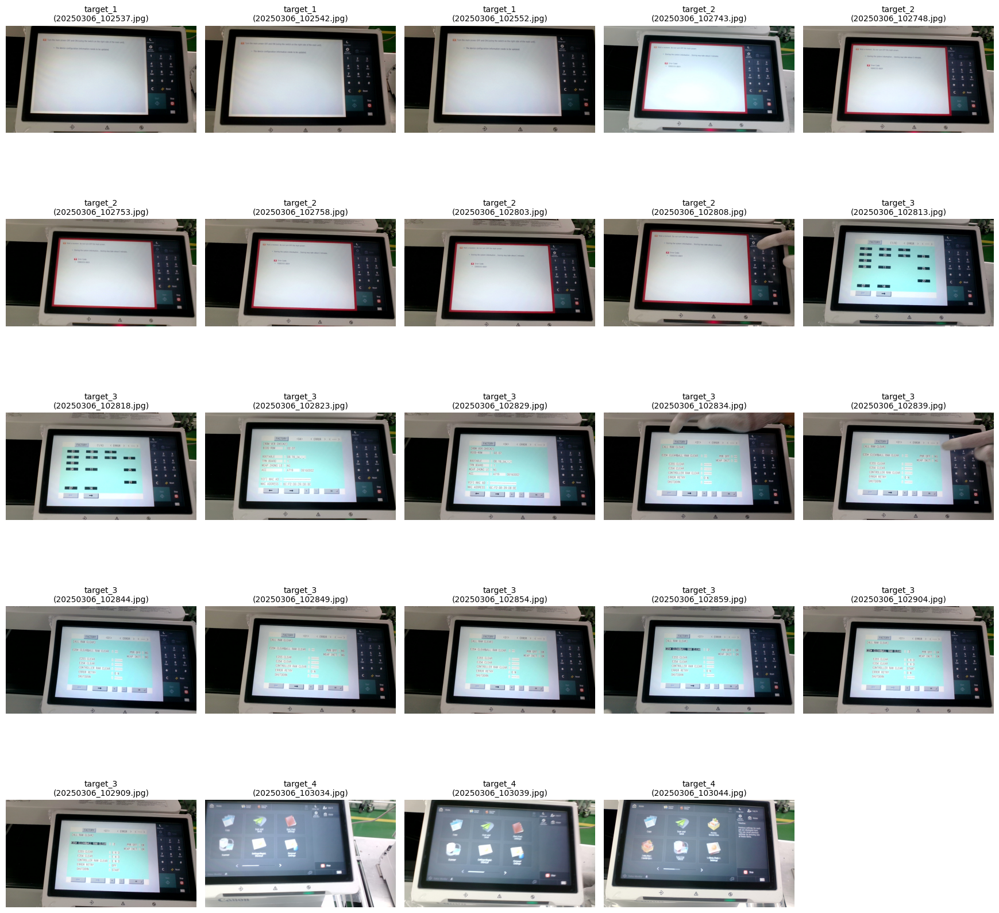

In [3]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# 설정
input_folder = "data/1cycle_image"  # 이미지 폴더 경로
class_order = ["target_1", "target_2", "target_3", "target_4"]

# class_order에 해당하는 label만 수집
matched_images = [
    (img_name, label)
    for img_name, label in zip(image_files, predicted_sequence)
    if label in class_order
]

# 이미지 시각화
n = len(matched_images)
cols = min(n, 5)
rows = (n + cols - 1) // cols

plt.figure(figsize=(3.5 * cols, 3.5 * rows))
for i, (img_name, label) in enumerate(matched_images):
    img_path = os.path.join(input_folder, img_name)
    image = Image.open(img_path).convert("RGB")
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image)
    plt.title(f"{label}\n({img_name})", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()

target_1 - total 3images


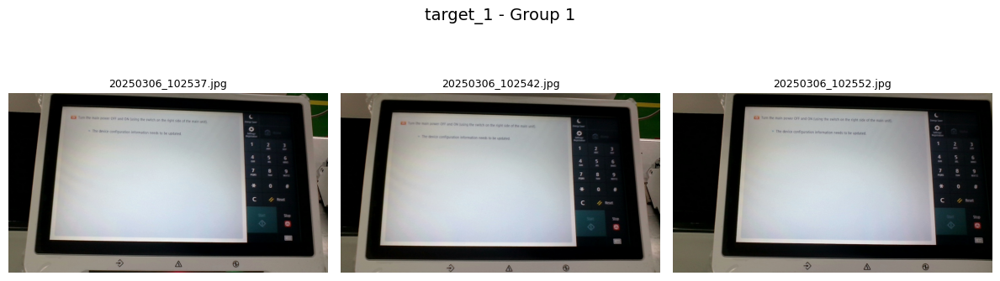

target_2 - total 6images


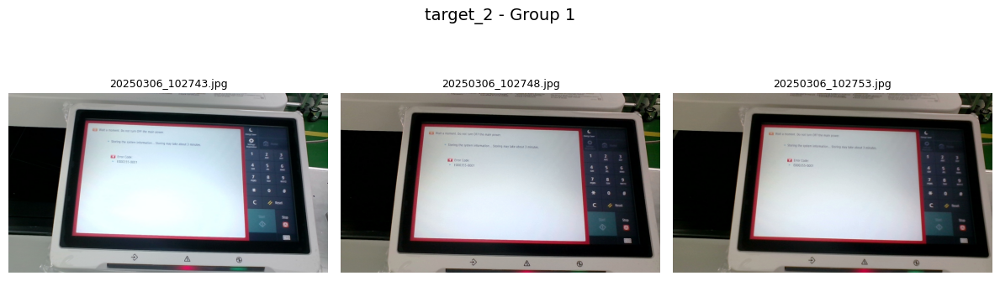

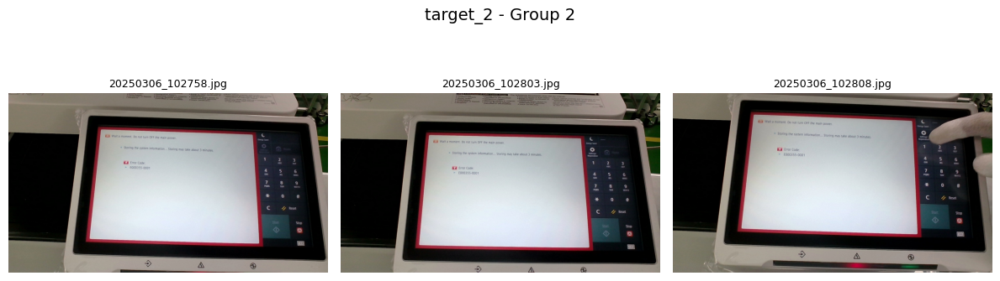

target_3 - total 12images


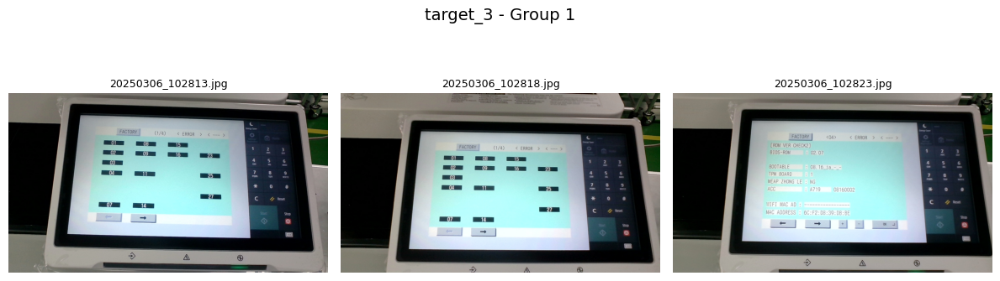

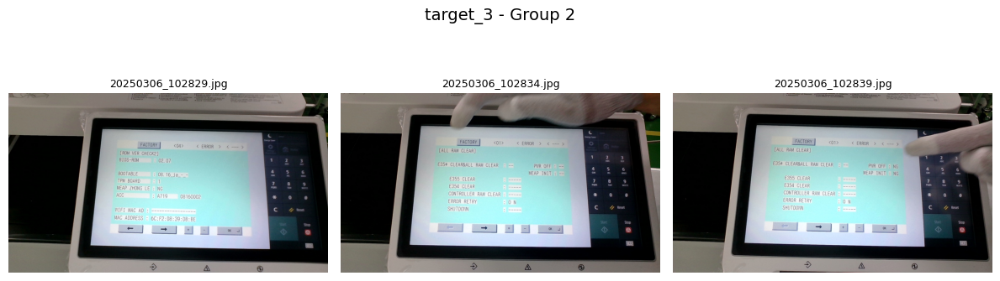

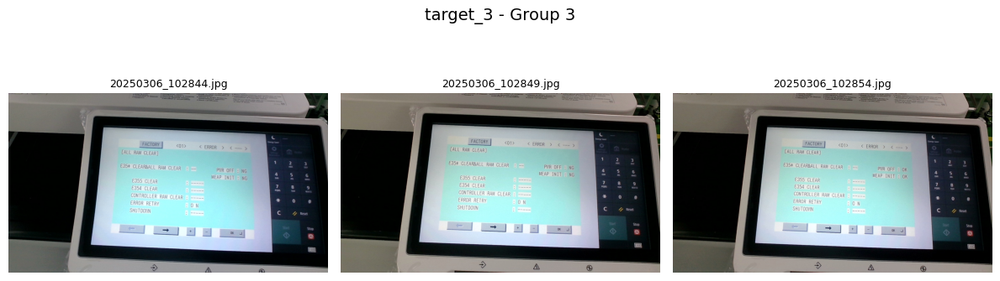

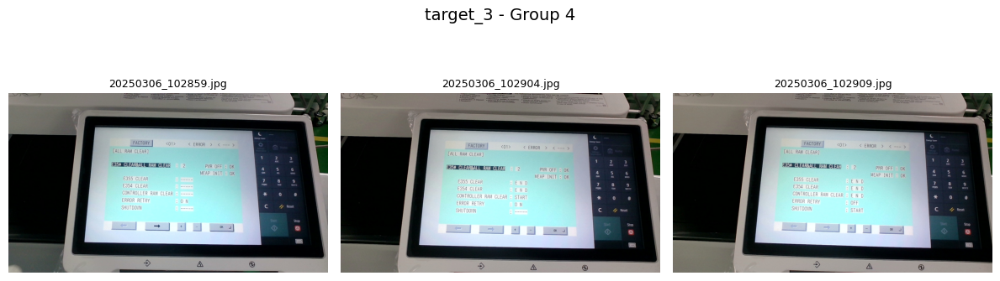

target_4 - total 3images


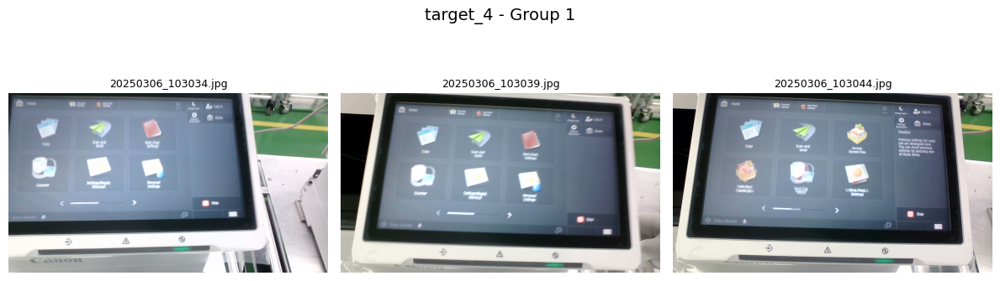

In [4]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# 설정
input_folder = "data/1cycle_image"
class_order = ["target_1", "target_2", "target_3", "target_4"]

# 타겟별 이미지 분류
target_to_images = {target: [] for target in class_order}

for img_name, label in zip(image_files, predicted_sequence):
    if label in class_order:
        target_to_images[label].append(img_name)

# 3장씩 나눠서 시각화
for target in class_order:
    images = target_to_images[target]
    if not images:
        continue

    print(f"{target} - total {len(images)}images")

    for group_idx in range(0, len(images), 3):
        group = images[group_idx:group_idx + 3]

        plt.figure(figsize=(12, 4))
        for i, img_name in enumerate(group):
            img_path = os.path.join(input_folder, img_name)
            image = Image.open(img_path).convert("RGB")

            plt.subplot(1, 3, i + 1)
            plt.imshow(image)
            plt.title(img_name, fontsize=9)
            plt.axis("off")

        plt.suptitle(f"{target} - Group {group_idx // 3 + 1}", fontsize=14)
        plt.tight_layout()
        plt.show()

🎯 target_1 - 총 3장


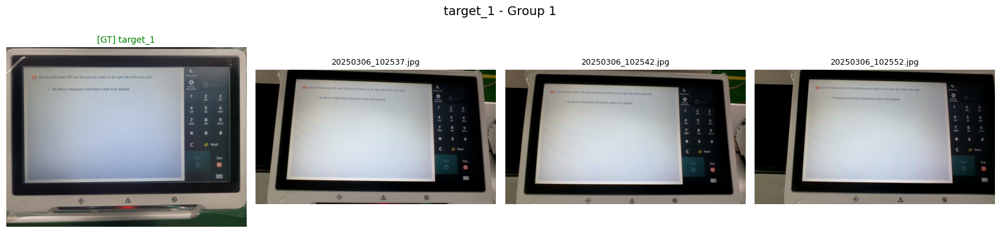

🎯 target_2 - 총 6장


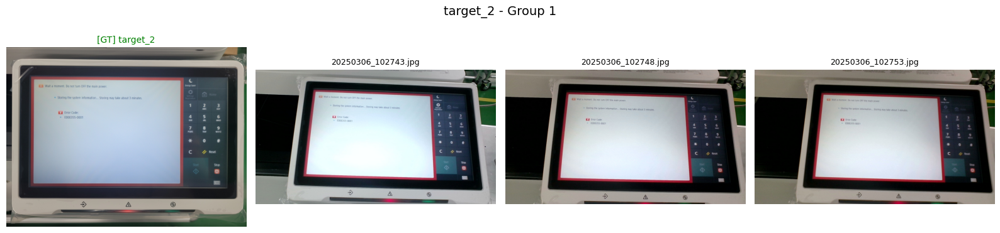

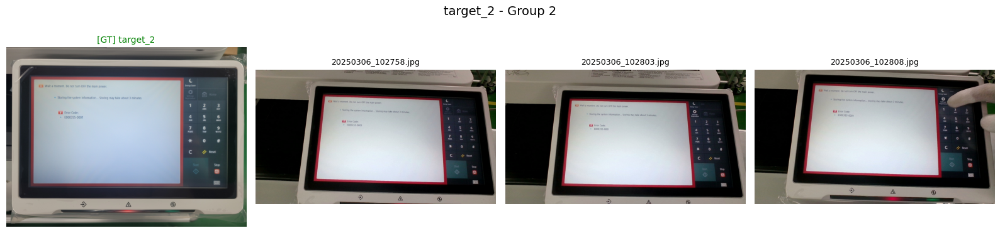

🎯 target_3 - 총 12장


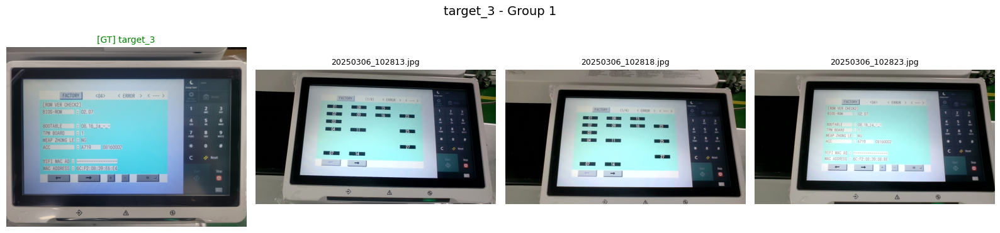

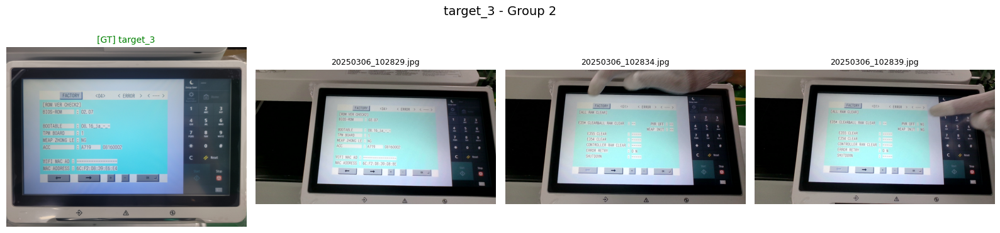

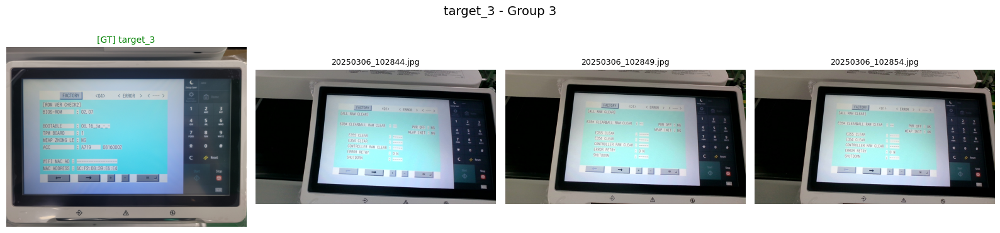

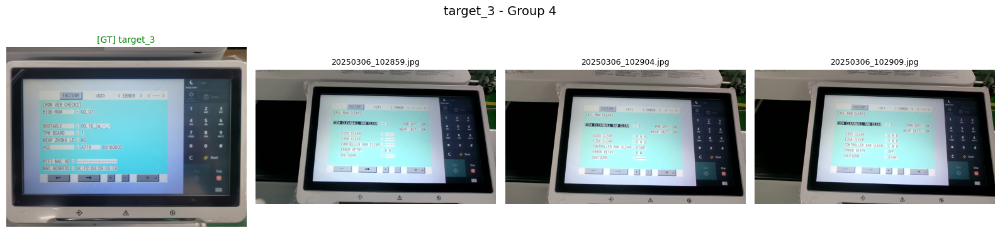

🎯 target_4 - 총 3장


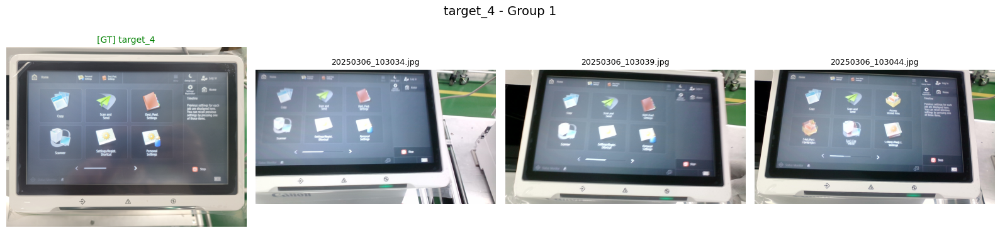

In [5]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# 설정
input_folder = "data/1cycle_image"
origin_folder = "data/origin"
class_order = ["target_1", "target_2", "target_3", "target_4"]

# 타겟별 이미지 분류
target_to_images = {target: [] for target in class_order}

for img_name, label in zip(image_files, predicted_sequence):
    if label in class_order:
        target_to_images[label].append(img_name)

# 타겟별 그룹 시각화 (3장씩 + 실제 타겟 이미지 1장)
for i, target in enumerate(class_order):
    images = target_to_images[target]
    if not images:
        continue

    print(f"🎯 {target} - 총 {len(images)}장")

    # 실제 타겟 이미지 경로 (1~4는 target_1~4에 대응)
    origin_image_path = os.path.join(origin_folder, f"img_{i+1}.jpg")
    origin_image = Image.open(origin_image_path).convert("RGB")

    for group_idx in range(0, len(images), 3):
        group = images[group_idx:group_idx + 3]

        plt.figure(figsize=(16, 4))

        # 첫 번째 subplot: 실제 타겟 이미지
        plt.subplot(1, 4, 1)
        plt.imshow(origin_image)
        plt.title(f"[GT] {target}", fontsize=10, color="green")
        plt.axis("off")

        # 나머지 subplot: 예측 이미지들
        for j, img_name in enumerate(group):
            img_path = os.path.join(input_folder, img_name)
            image = Image.open(img_path).convert("RGB")

            plt.subplot(1, 4, j + 2)
            plt.imshow(image)
            plt.title(img_name, fontsize=9)
            plt.axis("off")

        plt.suptitle(f"{target} - Group {group_idx // 3 + 1}", fontsize=14)
        plt.tight_layout()
        plt.show()